# Kontrastive Embeddings für die Text-zu-Bild-Suche


## Projektbeschreibung

Dieses Projekt hat zum Ziel, ein Text-zu-Bild-Retrieval-System zu entwickeln – eine Anwendung, die es Benutzern ermöglicht, eine textuelle Beschreibung einzugeben und daraus die relevantesten Bilder aus einem Datensatz zu extrahieren. Die zentralen Zielsetzungen sind:

**Nachweis der Machbarkeit**  

Demonstration, dass ein Modell in der Lage ist, Bilder und textuelle Beschreibungen in einen gemeinsamen Vektorraum (oder in eine geeignete Metrik) abzubilden, sodass Ähnlichkeiten gemessen und zur Rangordnung der Bilder verwendet werden können.

**Untersuchung unterschiedlicher Ansätze**  

- **Regressionsbasierte Modelle** Diese behandeln die Zuordnung von Bild und Text als ein Problem der Vorhersage eines numerischen Scores.  
- **Kontrastive Ähnlichkeitsansätze:** Hierbei werden Bild- und Texteinbettungen gemeinsam erlernt, um die Übereinstimmung passender Paare zu maximieren und gleichzeitig Nicht-Übereinstimmungen zu minimieren.

**Berücksichtigung rechtlicher Vorgaben**  
In einigen Rechtsgebieten dürfen Bilder, auf denen Kinder unter 16 Jahren abgebildet sind, ohne ausdrückliche Zustimmung weder angezeigt noch verarbeitet werden. Um diesen Vorgaben gerecht zu werden, werden im Rahmen des Projekts Bilder sowie zugehörige Texte, die bestimmte Compliance-Schlüsselwörter enthalten, systematisch ausgeschlossen.

## Projektaufbau


### Abhängigkeiten


In [1]:
import os
import random

from abc import ABC, abstractmethod
from dataclasses import dataclass, field
from typing import Iterable

import matplotlib.patches as patches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import DataLoader, Dataset
from torchinfo import summary
from torchvision import transforms
from torchvision.models import ResNet50_Weights, resnet50
from tqdm import tqdm
from transformers import BertModel, BertTokenizer, PreTrainedTokenizer
from IPython import display
from PIL import Image, ImageEnhance

### Konstanten und globale Variablen


In [2]:
ROOT = "datasets/to_upload"
SEED = 42
INFERENCE_REG = True
INFERENCE_SM = True

VERSION = 1

EPOCHS_LR = 6
EPOCHS_NN = 6
EPOCHS_SM = 6

MAX_AMOUNT_OF_DESCRIPTIONS = 6  # Has an impact on amount of augmented images


# Global Variables
# ================
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

### Übersicht


In [3]:
train_df = pd.read_csv(f"{ROOT}/train_dataset.csv")
train_df.info()
train_df.head(1).T

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


,0
image,1056338697_4f7d7ce270.jpg
query_id,2549968784_39bfbe44f9.jpg#2
query_text,A young child is wearing blue goggles and sitt...


In [4]:
test_queries_df_ = pd.read_csv(f"{ROOT}/test_queries.csv", delimiter="|")
test_queries_df = test_queries_df_[["query_id", "query_text", "image"]]
test_queries_df.info()
test_queries_df.head(1).T

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 11.8+ KB


,0
query_id,1177994172_10d143cb8d.jpg#0
query_text,"Two blonde boys , one in a camouflage shirt an..."
image,1177994172_10d143cb8d.jpg


In [5]:
crowd_df = pd.read_csv(
    f"{ROOT}/CrowdAnnotations.tsv",
    delimiter="\t",
    header=None,
    names=["image", "query_id", "match_share", "match", "not_match"]
)
crowd_df.info()
crowd_df.head(1).T

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image        47830 non-null  object 
 1   query_id     47830 non-null  object 
 2   match_share  47830 non-null  float64
 3   match        47830 non-null  int64  
 4   not_match    47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


,0
image,1056338697_4f7d7ce270.jpg
query_id,1056338697_4f7d7ce270.jpg#2
match_share,1.0
match,3
not_match,0


In [6]:
expert_df = pd.read_csv(
    f"{ROOT}/ExpertAnnotations.tsv",
    delimiter="\t",
    header=None,
    names=["image", "query_id", "exp1", "exp2", "exp3"]
)
expert_df.info()
expert_df.head(1).T

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   exp1      5822 non-null   int64 
 3   exp2      5822 non-null   int64 
 4   exp3      5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB


,0
image,1056338697_4f7d7ce270.jpg
query_id,2549968784_39bfbe44f9.jpg#2
exp1,1
exp2,1
exp3,1


### Datenklassen

In [7]:
@dataclass
class Train:
    query_id: str           # Format: "<source_image>#<description_index>"
    query_text: str         # The actual text description
    label: str = None
    crowd_target: float = None
    expert_target: float = None

    def target(self) -> float:
        if isinstance(self.expert_target, float):
            if self.crowd_target is None:
                return self.expert_target
            if self.expert_target > self.crowd_target:
                return self.expert_target
        if self.crowd_target is None:
            return 0.0
        return self.crowd_target


@dataclass
class TestQuery:
    query_id: str          # Format: "<source_image>#<description_index>"
    query_text: str        # The text used as the query
    image: str             # The ground-truth image filename


In [8]:
@dataclass
class Crowd:
    query_id: str          # "<image filename>#<description_index>"
    match_share: float     # Target
    match: int             # Count of users confirming the match
    not_match: int         # Count of users indicating a mismatch

    def target(self) -> float:
        return self.match / (self.match + self.not_match)


@dataclass
class Expert:
    query_id: str          # Format: "<image filename>#<description_index>"
    exp1: int              # Expert 1's rating (1 to 4)
    exp2: int              # Expert 2's rating (1 to 4)
    exp3: int              # Expert 3's rating (1 to 4)

    def target(self) -> float:
        return ((self.exp1 + self.exp2 + self.exp3) - 3.0) / 9.0

In [9]:
class AugmentationFunction(ABC):
    """
    Abstract base class for image augmentation functions.
    """
    @abstractmethod
    def apply(
        self, image_data: "ImageDataBase", *_, **kwargs
    ) -> Iterable[tuple[str, float, Image.Image]]:
        """
        Applies augmentation and returns an iterable of (text, score, image).
        """
        pass


@dataclass
class ImageDataBase:
    file_name: str
    path: str
    seed: int = 42
    train: list[Train] = field(default_factory=list)
    crowd: list[Crowd] = field(default_factory=list)
    expert: list[Expert] = field(default_factory=list)
    test: list[TestQuery] = field(default_factory=list)
    descriptions: list[str] = field(default_factory=list)
    augmentation_fx: AugmentationFunction = None

    def display_image(self, width: int = 300, height: int = None):
        display.display(
            display.Image(os.path.join(self.path), width=width, height=height)
        )

    def augmentation(
        self, *_, **kwargs
    ) -> Iterable[tuple[str, float, Image.Image]]:
        try:
            img = Image.open(self.path)
        except FileNotFoundError as e:
            print(f"Unable to load image at {self.path}: {e}")
            return  # Exit the generator immediately
        if self.augmentation_fx is None:
            yield (self.descriptions[0][1], self.descriptions[0][0], img)
        elif isinstance(self.augmentation_fx, AugmentationFunction):
            yield from self.augmentation_fx.apply(
                self, *_, seed=self.seed, **kwargs
            ) 

    def __str__(self, br: str = " | ") -> str:
        txt = f"Image({self.file_name}) => "
        for attr in ["train", "test", "crowd", "expert"]:
            txt += f"{br}{len(getattr(self, attr))} {attr}"
        return txt + (
            " - TXT: " + self.descriptions[0][1] if self.descriptions else ""
        )


In [10]:
@dataclass
class ImageData(ImageDataBase):
    exclude: bool = False

    def set_train_target(self):
        for train_data in self.train:
            for crowd_annotation in self.crowd:
                if crowd_annotation.query_id == train_data.query_id:
                    train_data.crowd_target = crowd_annotation.target()
            for expert_annotation in self.expert:
                if expert_annotation.query_id == train_data.query_id:
                    train_data.expert_target = expert_annotation.target()

    def get_highest_scores(
        self, head: int = 5, subset: str = "train"
    ) -> list[Train]:
        """
        Returns a list of the top Train objects ranked by both expert and crowd
        """
        annotations: list[Train | Crowd | Expert] = getattr(self, subset)
        if not annotations:
            return []
        return sorted(annotations, key=lambda tr: tr.target(), reverse=True)[
            :head
        ]
    
    def add_best_descriptions(
        self,
        text_mapping: dict[str, str],
        head: int = 5,
        subsets: list[str] = ["crowd", "expert"],
        threshold: float = 0.0,
        rm_duplicates: bool = True
    ) -> None:
        """Adds best descriptions sorted by target"""
        self.descriptions.clear()
        ranking = []
        for subset in subsets:
            top_annotations = self.get_highest_scores(head=head, subset=subset)
            for annot in top_annotations:
                txt = text_mapping.get(annot.query_id)
                if txt and annot.target() >= threshold:
                    ranking.append((annot.target(), isinstance(
                        annot, Expert), txt)
                    )
        ranking.sort(key=lambda x: (x[0], x[1]), reverse=True)
        if rm_duplicates:
            seen_descriptions = set()
            unique_descriptions = []
            for score, _, desc in ranking:
                if desc not in seen_descriptions:
                    seen_descriptions.add(desc)
                    unique_descriptions.append((round(score, 2), desc))
            self.descriptions = unique_descriptions[: head * len(subsets)]
        else:
            self.descriptions = [
                (round(score, 2), desc) for score, _, desc in ranking
            ]



In [11]:
@dataclass
class ImageDataset:
    folder: tuple[str, tuple[str, str]]
    train: dict[str, ImageData] = field(default_factory=dict)
    test: dict[str, ImageData] = field(default_factory=dict)
    text_train: dict[str, str] = field(default_factory=dict)
    text_test: dict[str, str] = field(default_factory=dict)
    seed: int = 42

    def get_or_create_image(
        self, name: str, is_test: bool = False
    ) -> ImageData:
        img_dict = self.test if is_test else self.train
        if name not in img_dict:
            path = os.path.join(
                self.folder[0] + self.folder[1][int(is_test)], name
            )
            img_dict[name] = ImageData(
                file_name=name, path=path, seed=self.seed
            )
        return img_dict[name]

    def get_or_create_text(
        self, query_id: str, query_text: str, is_test: bool = False
    ) -> str:
        text_dict = self.text_test if is_test else self.text_train
        if query_id in text_dict:
            existing_text = text_dict[query_id]
            if existing_text != query_text:
                raise ValueError(f"Text mismatch for {query_id}")
            return existing_text
        else:
            text_dict[query_id] = query_text
            return query_text

    def split_train(
        self, train_ratio: float = 0.8
    ) -> tuple[dict[str, ImageData], dict[str, ImageData]]:
        if not self.train:
            return {}, {}
        random.seed(self.seed)
        train_keys = list(self.train.keys())  
        random.shuffle(train_keys)
        train_size = int(len(train_keys) * train_ratio)
        train_subset_keys = train_keys[:train_size]
        val_subset_keys = train_keys[train_size:]
        train_subset = {key: self.train[key] for key in train_subset_keys}
        val_subset = {key: self.train[key] for key in val_subset_keys}
        return train_subset, val_subset
    
    def add_agmentation_generator(
        self, fx: AugmentationFunction = None
    ) -> None:
        for _, img_data in self.train.items():
            img_data.augmentation_fx = fx



#### Objekte mit Daten laden

In [12]:
img_dataset = ImageDataset(
    folder=(ROOT, ("/train_images", "/test_images"))
)


for idx, row in train_df.iterrows():
    img = img_dataset.get_or_create_image(row['image'])
    train_data = Train(query_id=row['query_id'], query_text=row['query_text'])
    img_dataset.get_or_create_text(train_data.query_id, train_data.query_text)
    img.train.append(train_data)


for idx, row in crowd_df.iterrows():
    img = img_dataset.get_or_create_image(row["image"])
    crowd_annotation = Crowd(
        query_id=row["query_id"],
        match_share=int(row["match_share"]),
        match=int(row["match"]),
        not_match=int(row["not_match"])
    )
    img.crowd.append(crowd_annotation)


for idx, row in expert_df.iterrows():
    image_filename = row["image"]
    img = img_dataset.get_or_create_image(row["image"])
    expert_annotation = Expert(
        query_id=row["query_id"],
        exp1=int(row["exp1"]),
        exp2=int(row["exp2"]),
        exp3=int(row["exp3"])
    )
    img.expert.append(expert_annotation)


#### Beispiel für den Datenzugriff

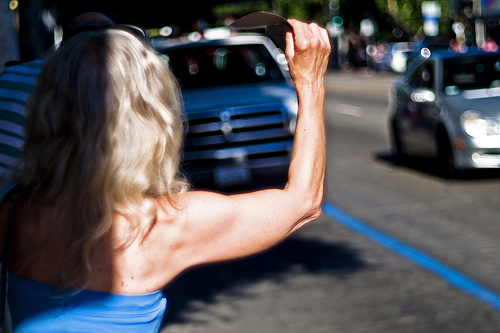

Image(1056338697_4f7d7ce270.jpg) =>  | 8 train | 0 test | 50 crowd | 8 expert


In [13]:
for _, img in img_dataset.train.items():
    img.display_image()
    print(img)
    break


#### Untersuchung und Bewertung von Beschreibungen


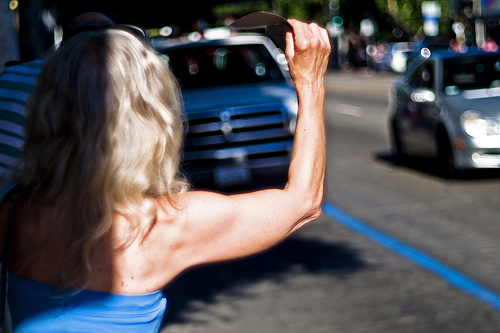

Image(1056338697_4f7d7ce270.jpg) =>  | 8 train | 0 test | 50 crowd | 8 expert

TRAIN
A woman plays with long red ribbons in an empty square . 0.2222222222222222
A girl wearing a yellow shirt and sunglasses smiles . 0.1111111111111111
A man sleeps under a blanket on a city street . 0.1111111111111111
Chinese market street in the winter time . 0.1111111111111111

CROWD
A woman is signaling is to traffic , as seen from behind . 1.0
A woman looking at view of a city . 1.0
A woman in a red shirt with her arm raised . 0.6666666666666666
A woman crosses the street near a man , who is on his cellphone . 0.3333333333333333

EXPERT
A woman plays with long red ribbons in an empty square . 0.2222222222222222
A girl wearing a yellow shirt and sunglasses smiles . 0.1111111111111111
A man sleeps under a blanket on a city street . 0.1111111111111111
Chinese market street in the winter time . 0.1111111111111111


In [14]:
for img_key in img_dataset.train:
    # Update Train with crowd_target and expert_target
    img_dataset.train[img_key].set_train_target()


example_1 = img_dataset.train["1056338697_4f7d7ce270.jpg"]
example_1.display_image()
print(example_1)
head_highest_scores = 4

for subset in ["train", "crowd", "expert"]:
    print("\n"+ subset.upper())
    example_1_scores = example_1.get_highest_scores(
        head_highest_scores, subset=subset
    )
    for annotation in example_1_scores:
        print(img_dataset.text_train[annotation.query_id], annotation.target())


Dieser Codeausschnitt aktualisiert die Trainingsdaten jedes Bildes mit den entsprechenden Crowd- und Expertenbewertungen, indem `set_train_target()` aufgerufen wird.

Anschließend wird für ein ausgewähltes Bild Folgendes angezeigt:

- Die relevantesten Textbeschreibungen mit ihren Bewertungen, abgeleitet aus den Trainings-, Crowd- und Experten-Subsets.
- Eine gefilterte Auswahl der höchstbewerteten Beschreibungen mithilfe von `add_best_descriptions()`, die anschließend für das Modelltraining oder zur Anzeige genutzt werden kann.

Dadurch wird sichtbar, wie unterschiedlich Crowd- und Expertenbewertungen die Relevanz der einzelnen Beschreibungen für das Bild einstufen.


In [15]:
example_1.add_best_descriptions(img_dataset.text_train, head=5, threshold=0.6)
print(example_1)
example_1.descriptions

Image(1056338697_4f7d7ce270.jpg) =>  | 8 train | 0 test | 50 crowd | 8 expert - TXT: A woman is signaling is to traffic , as seen from behind .


[(1.0, 'A woman is signaling is to traffic , as seen from behind .'),
 (1.0, 'A woman looking at view of a city .'),
 (0.67, 'A woman in a red shirt with her arm raised .')]

## Vorverarbeitung


### Compliance-Schlüsselwörter


In [16]:
# Compliance Processing
# =====================
compliance_keywords = [
    "child",
    "boy",
    "girl",
    "baby",
    "toddler",
    "kid",
    "infant",
    "teen",
    "teenager",
    "minor",
    "newborn",
    "preschooler",
    "youth",
]

### Testdaten laden und filtern


In [17]:
# Test Data
# =========
for idx, row in test_queries_df.iterrows():
    if not any(
        kw in str(row["query_text"]).lower() for kw in compliance_keywords
    ):
        img = img_dataset.get_or_create_image(row['image'], is_test=True)
        test_query = TestQuery(
            query_id=row["query_id"],
            query_text=row["query_text"],
            image=row["image"]
        )
        img_dataset.get_or_create_text(
            train_data.query_id, train_data.query_text, is_test=True
        )
        img.train.append(test_query)
        img.descriptions.append((1.0, row["query_text"]))


len(img_dataset.test)

76

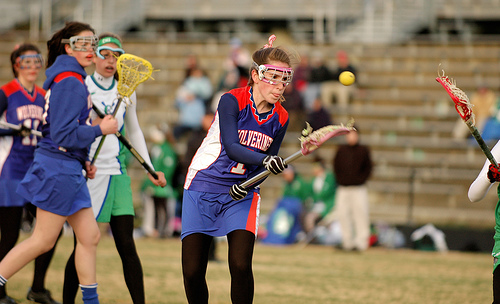

[(1.0, 'Several female lacrosse players are going after a ball .'),
 (1.0, 'The woman lacrosse player in blue is about to catch the ball .'),
 (1.0, 'Women play lacrosse .')]

In [18]:
example_2 = img_dataset.test["123997871_6a9ca987b1.jpg"]
example_2.display_image()
example_2.descriptions

### Vorverarbeitungsschleife


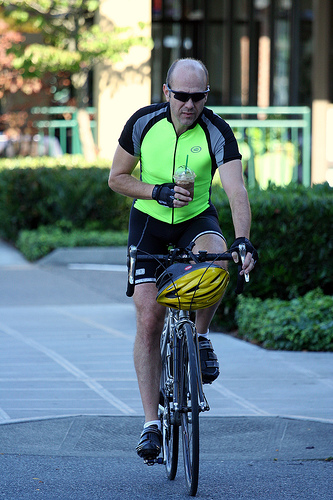

1262583859_653f1469a9.jpg
(1.0, 'A man in a bright green shirt riding a bicycle in a paved courtyard , carying a drink .')
(1.0, 'A man rides a bike through a course .')
(0.67, 'A young boy is riding a bike .')


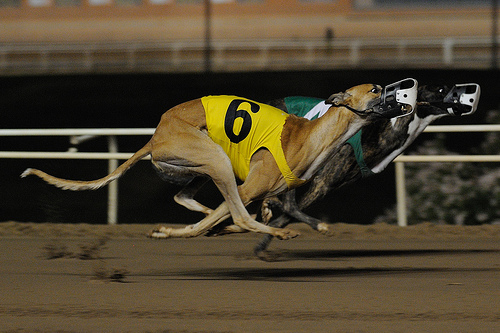

2968182121_b3b491df85.jpg
(1.0, 'A greyhound wearing a muzzle and the number six on a yellow jacket is running on a dog track .')
(1.0, 'Two greyhounds race .')
(0.67, 'A greyhound runs in a race , bee striped jacket , number eight .')


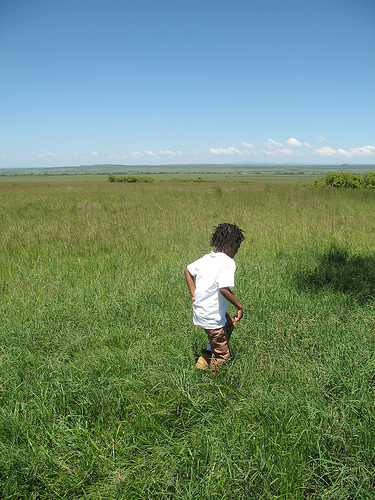

566397227_a469e9e415.jpg
(1.0, 'A small boy with braids runs through a field of tall green grass .')
(0.67, 'Two children playing with a ball on the grass .')
(0.33, 'A man in a rugby uniform hitting a ball in a grassy field .')


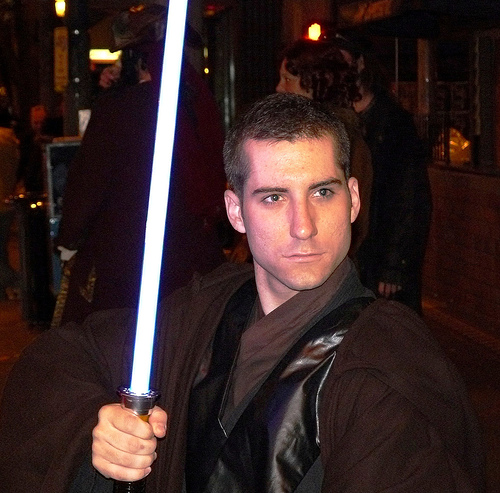

1836335410_de8313a64e.jpg
(1.0, 'Man dressed up in black and brown and holding a white light saber .')
(0.11, 'Two people are sitting next to a wood-stacked campfire at night .')
(0.11, 'two men sit on a chairlift .')


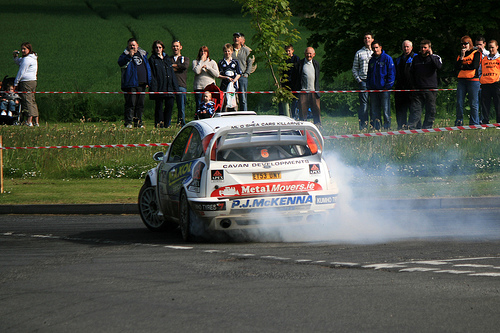

2533424347_cf2f84872b.jpg
(1.0, 'A race car screeches through a turn as spectators watch .')
(0.33, 'a red and white race car racing on a dirt racetrack .')
(0.0, 'two small brown and white dogs standing beside some white chairs')


In [19]:
description_threshold = 0.0
subsets = ["crowd", "expert"]
for img_id, (jpg, image) in enumerate(img_dataset.train.items()):
    image.add_best_descriptions(
        img_dataset.text_train,
        head=MAX_AMOUNT_OF_DESCRIPTIONS // len(subsets),
        subsets=subsets,
        threshold=description_threshold
    )
    if len(image.descriptions) == 0:
        image.exclude = True
    elif any(
        kw in image.descriptions[0][1].lower() for kw in compliance_keywords
    ):
        image.exclude = True  # Complience filter
    if img_id % 250 == 1:
        image.display_image(width=200)
        print(image.file_name)
        for cnt, description in enumerate(image.descriptions):
            if cnt == 3:
                break
            print(description)


### Beispiel für ein ausgeschlossenes Bild

Dieser Abschnitt filtert die Beschreibungen der einzelnen Bilder anhand folgender Kriterien:

- Die relevantesten Beschreibungen werden anhand von Crowd- oder Expertenbewertungen ermittelt und ausgewählt.
- Bilder ohne gültige Beschreibungen oder mit Begriffen, die auf Complience-Verstoß hinweisen, werden ausgeschlossen, um rechtliche Vorgaben einzuhalten.
- Zur Veranschaulichung wird jedes 250. Bild zusammen mit den ausgewählten Beschreibungen angezeigt.


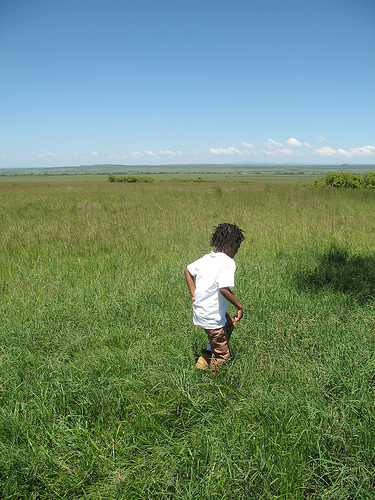

Image(566397227_a469e9e415.jpg) =>  | 7 train | 0 test | 50 crowd | 7 expert - TXT: A small boy with braids runs through a field of tall green grass .


True

In [20]:
example_3 = img_dataset.train["566397227_a469e9e415.jpg"]
example_3.display_image(width=200)
print(example_3)

example_3.exclude

### Ausschließen von Bildern aus dem Trainingsdatensatz


In [21]:
len_before = len(img_dataset.train)
img_dataset.train = {
    jpg:img for jpg, img in img_dataset.train.items() if img.exclude == False
}

len_before, len(img_dataset.train)

(1002, 709)

Zum Schluss werden alle Bilder, die zur Ausschließung markiert wurden (`image.exclude = True`), aus dem Trainingsdatensatz entfernt. Dadurch bleibt nur eine Auswahl an Bildern übrig, die den Compliance-Vorgaben entsprechen und ausreichend annotiert sind.


### Zielvariable (EDA)


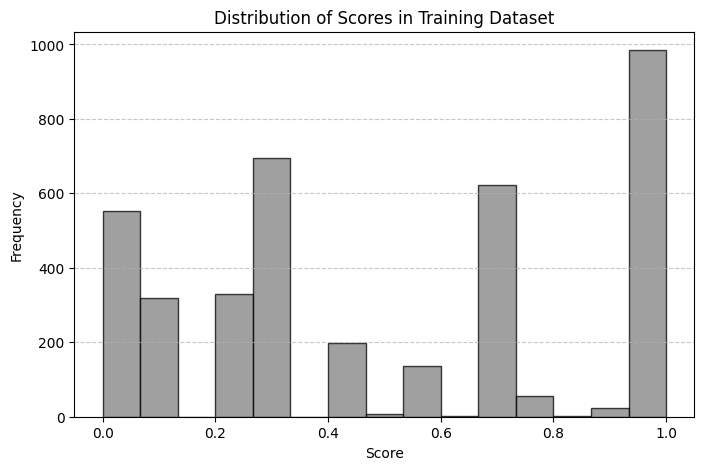

In [22]:
all_scores = [
    score for img_ in img_dataset.train.values()
    for score, _ in img_.descriptions
]
plt.figure(figsize=(8, 5))
plt.hist(all_scores, bins=15, edgecolor='black', color="grey", alpha=0.75)
plt.xlabel("Score")
plt.ylabel("Frequency")
plt.title("Distribution of Scores in Training Dataset")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Dieses Histogramm zeigt die Verteilung der Bild-Beschreibungs-Übereinstimmungswerte im Trainingsdatensatz, die von 0.0 bis 1.0 reichen. Auffällig ist die hohe Anzahl perfekter Übereinstimmungen bei 1.0 sowie deutliche Häufungen im Bereich zwischen 0.2–0.4 und 0.6. Der Parameter `MAX_AMOUNT_OF_DESCRIPTIONS` beeinflusst diese Verteilung, indem er mehr Einträge in den niedrigen Bereich verschiebt. Da pro Bild nur eine begrenzte Anzahl an hochbewerteten Beschreibungen ausgewählt wird, bleiben viele schwächer bewertete Paare unberücksichtigt und konzentrieren sich am unteren Ende der Skala.


## Datenaugmentation


In [23]:
class RotateContrastBrightnessFlip(AugmentationFunction):
    """
    Applies augmentation with rotation, contrast, brightness, and horizontal
    flipping.
    """
    def apply(
        self, image_data: ImageData, *_, **kwargs
    ) -> Iterable[tuple[str, float, Image.Image]]:
        seed = kwargs.get("seed", 42)
        random.seed(seed)
        for score, desc in image_data.descriptions:
            try:
                img = Image.open(image_data.path).convert("RGB")
            except FileNotFoundError as e:
                print(f"Error: {e}")
                continue
            img = img.rotate(random.uniform(-5, 5))
            enhancer = ImageEnhance.Contrast(img)
            img = enhancer.enhance(random.uniform(0.95, 1.05))
            enhancer = ImageEnhance.Brightness(img)
            img = enhancer.enhance(random.uniform(0.95, 1.05))
            flip_chance = random.random()
            if flip_chance > 0.5:
                img = img.transpose(Image.FLIP_LEFT_RIGHT)
            yield (desc, score, img)


Die Klasse `RotateContrastBrightnessFlip` führt eine Reihe gezielter Bildtransformationen durch, darunter zufällige Rotation, Anpassung von Kontrast und Helligkeit sowie horizontales Spiegeln. Dabei bleiben die zugehörigen Textbeschreibungen und Bewertungen erhalten.

Im Detail:

- Reproduzierbare Zufälligkeit: Eine feste Zufallszahl (standardmäßig `seed=42`) sorgt für konsistente Ergebnisse über verschiedene Durchläufe hinweg.
- Zufällige Rotation: Jedes Bild wird um einen kleinen zufälligen Winkel gedreht, um Variationen in der Ausrichtung zu erzeugen.
- Anpassung von Kontrast & Helligkeit: Der Kontrast und die Helligkeit werden leicht innerhalb eines schmalen Bereichs (±5 %) verändert, um unterschiedliche Lichtverhältnisse zu simulieren.
- Horizontales Spiegeln: Mit einer Wahrscheinlichkeit von 50 % wird das Bild gespiegelt, um die Vielfalt der Bildausrichtung zu erhöhen.
- Speicheroptimierte Verarbeitung: Durch die Verwendung von `yield` werden die augmentierten Bilder als Stream ausgegeben, anstatt sie alle gleichzeitig im Arbeitsspeicher zu halten. Dies macht die Methode besonders effizient für große Datensätze.

Score: 1.0 Description A race car screeches through a turn as spectators watch .


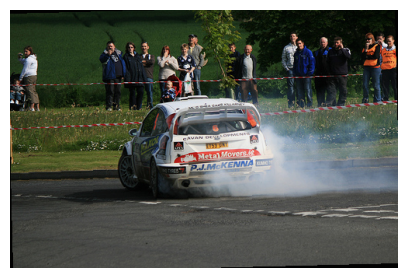

Score: 0.33 Description a red and white race car racing on a dirt racetrack .


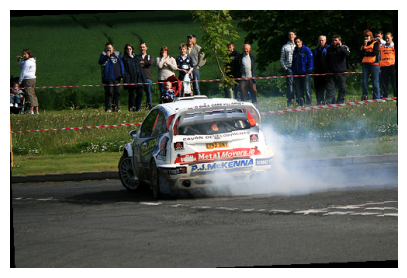

Score: 0.0 Description two small brown and white dogs standing beside some white chairs


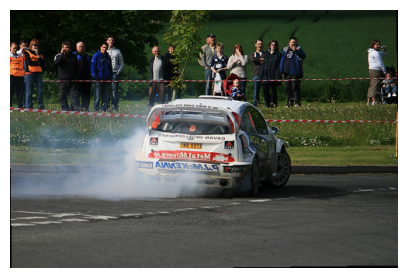

In [24]:
img_dataset.add_agmentation_generator(RotateContrastBrightnessFlip())

example_3 = img_dataset.train["2533424347_cf2f84872b.jpg"]
count = 0
for desc, score, aug_img in example_3.augmentation():
    plt.figure(figsize=(5, 5))
    plt.imshow(aug_img)
    plt.axis("off")  # Hide axes
    print("Score:", score, "Description", desc)
    plt.show()
    count += 1
    if count == 3:
        break


Im Beispielcode wird ein Bild aus `img_dataset.train` geladen und in drei verschiedenen augmentierten Versionen dargestellt. Jede dieser Varianten behält die ursprüngliche textuelle Beschreibung und den gleichen Ähnlichkeitswert bei. Durch das Training mit visuell unterschiedlichen, aber semantisch identischen Bildern wird die Robustheit des Modells erhöht und das Risiko von Overfitting reduziert.

Die Augmentierungslogik wird über den Aufruf `img_dataset.add_agmentation_generator(...)` in den Datensatz eingebunden, wodurch sie vom Kern des Datensatzcodes getrennt bleibt. Dieses Prinzip, bekannt als Dependency Injection, verbessert die Wartbarkeit, Testbarkeit und Erweiterbarkeit des Codes.

Das Konzept wurde außerdem in einem [Blogartikel über Interfaces](https://www.ehoppe.com/Python-Development/2024/04/26/dependency-injection-und-interface-pattern-in-python/) erläutert.


## Utils


### Training (Allgemein)

In [25]:
class EarlyStopping:
    def __init__(self, patience=3, min_delta=0.0):
        self.patience = patience
        self.min_delta = min_delta
        self.best_loss = float("inf")
        self.counter = 0

    def __call__(self, val_loss):
        if val_loss < self.best_loss - self.min_delta:
            self.best_loss = val_loss
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                print("Early stopping triggered!")
                return True
        return False

In [26]:
class Trainer:
    """
    Generic trainer class to handle training and validation loops, and early
    stopping.
    """
    def __init__(
        self,
        model: nn.Module,
        train_loader: DataLoader,
        val_loader: DataLoader,
        optimizer: torch.optim.Optimizer,
        criterion: nn.Module,
        device: torch.device,
        epochs: int = 10,
        patience: int = 3,
        min_delta: float = 0.0
    ):
        self.model = model
        self.train_loader = train_loader
        self.val_loader = val_loader
        self.optimizer = optimizer
        self.criterion = criterion
        self.device = device
        self.epochs = epochs
        self.early_stopping = EarlyStopping(
            patience=patience, min_delta=min_delta
        )

    def train_step(self, batch) -> float:
        image_embeddings = batch["image_embedding"].to(self.device)  # (B,2048)
        text_embeddings = batch["text_embedding"].to(self.device)    # (B,768)
        scores = batch["score"].to(self.device)                      # (B,)
        self.optimizer.zero_grad()
        preds = self.model(image_embeddings, text_embeddings)
        loss = self.criterion(preds, scores)
        loss.backward()
        self.optimizer.step()
        return loss.item()

    def val_step(self, batch) -> float:
        image_embeddings = batch["image_embedding"].to(self.device)
        text_embeddings = batch["text_embedding"].to(self.device)
        scores = batch["score"].to(self.device)
        with torch.no_grad():
            preds = self.model(image_embeddings, text_embeddings)
            loss = self.criterion(preds, scores)
        return loss.item()

    def fit(self):
        for epoch in range(self.epochs):
            # ---- Training Loop ----
            self.model.train()
            total_train_loss = 0.0
            train_batches = 0
            with tqdm(
                self.train_loader, desc=f"Epoch {epoch+1}/{self.epochs}"
            ) as pbar:

                for batch in pbar:
                    loss_value = self.train_step(batch)
                    total_train_loss += loss_value
                    train_batches += 1
                    pbar.set_postfix(loss=f"{loss_value:.4f}")

            avg_train_loss = total_train_loss / train_batches
            # ---- Validation Loop ----
            self.model.eval()
            total_val_loss = 0.0
            val_batches = 0
            with torch.no_grad():
                for batch in self.val_loader:
                    loss_value = self.val_step(batch)
                    total_val_loss += loss_value
                    val_batches += 1

            avg_val_loss = total_val_loss / val_batches if val_batches else 0
            print(f"Epoch [{epoch+1}/{self.epochs}] | "
                  f"Train Loss: {avg_train_loss:.4f} | "
                  f"Val Loss: {avg_val_loss:.4f}")
            # ---- Early Stopping ----
            if self.early_stopping(avg_val_loss):
                print(
                    "Stopping early due to no improvement in validation loss."
                )
                break

In [27]:
class BaseImageTextDataset(Dataset):
    def __init__(
        self,
        image_dataset_train: dict[str, ImageData],
        max_length: int = 32,
        transform = None
    ):
        self.image_dataset_train = image_dataset_train
        self.image_keys = list(image_dataset_train.keys())
        self.max_length = max_length
        self.transform = transform
        self.tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
        # Build a list of (key, desc, score, img) from augmentations
        self.data = []
        for key in self.image_keys:
            image_data = self.image_dataset_train[key]
            for desc, score, img in image_data.augmentation():
                self.data.append((key, desc, score, img))

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        raise NotImplementedError("Please implement in the child class.")


### Evaluierung (Allgemein)

In [28]:
class BaseEvaluator(ABC):
    def __init__(
        self,
        model: torch.nn.Module,
        dataset: ImageDataset,
        device: torch.device,
        tokenizer: PreTrainedTokenizer = None,
        image_transform: torch.nn.Module = None
    ):
        self.model = model
        self.dataset = dataset
        self.device = device
        self.tokenizer = tokenizer
        self.image_transform = image_transform

    @abstractmethod
    def encode_text(self, query_texts: list[str]) -> torch.Tensor:
        pass

    @abstractmethod
    def encode_images(self) -> dict[str, np.ndarray]:
        pass

    @abstractmethod
    def compute_scores(
        self, text_embeds: torch.Tensor, image_embeds: dict[str, np.ndarray]
    ) -> dict[str, float]:
        pass

    def compute_recall_at_k(
        self, ground_truth: str, scores: dict[str, float], k: int = 5
    ) -> int:
        top_k = sorted(scores.items(), key=lambda x: x[1], reverse=True)[:k]
        top_k_names = {img_name for img_name, _ in top_k}
        return 1 if ground_truth in top_k_names else 0

    def evaluate_recall_at_k(
        self, k: int = 5, one_caption_per_img: bool = True
    ) -> float:
        image_embeds = self.encode_images()
        total_recall = 0
        total_queries = 0

        for file_name, test_image in self.dataset.test.items():
            for _, test_text in test_image.descriptions:
                # shape: (1, embed_dim)
                text_embeds = self.encode_text([test_text])
                scores_dict = self.compute_scores(text_embeds, image_embeds)
                r = self.compute_recall_at_k(file_name, scores_dict, k=k)
                total_recall += r
                total_queries += 1
                if one_caption_per_img:
                    break

        avg_recall = total_recall / total_queries if total_queries else 0
        print(" * " * 20)
        print(f" Recall@{k}: {avg_recall:.4f}")
        print(" * " * 20)
        return avg_recall

    def display_results_with_ground_truth(
        self, ground_truth_image: str, scores: dict[str, float], top_k: int = 5
    ):
        sorted_results = sorted(
            scores.items(), key=lambda x: x[1], reverse=True
        )[:top_k]
        _, axes = plt.subplots(1, top_k + 1, figsize=(15, 5))
        def __add_highlight(ax, color='#35f075', linewidth=8.0):
            rect = patches.Rectangle(
                (0, 0),
                1, 1,
                fill=False, 
                edgecolor=color,
                linewidth=linewidth,
                transform=ax.transAxes,
                clip_on=False
            )
            ax.add_patch(rect)
        # --- Ground Truth image (left) ---
        gt_img_path = self.dataset.test[ground_truth_image].path
        gt_image = Image.open(gt_img_path)
        axes[0].imshow(gt_image)
        axes[0].axis("off")
        axes[0].set_title("Correct Image")
        __add_highlight(axes[0])
        # --- Top-K results (right) ---
        for i, (img_name, score) in enumerate(sorted_results, start=1):
            img_path = self.dataset.test[img_name].path
            image_ = Image.open(img_path)
            axes[i].imshow(image_)
            axes[i].axis("off")
            axes[i].set_title(f"Score: {score:.4f}")
            if img_name == ground_truth_image:
                __add_highlight(axes[i])

        plt.tight_layout()
        plt.show()

    def mvp_image_search(self, query: str, top_k: int = 5):
        text_embed = self.encode_text([query])  # (1, embed_dim)
        image_embeds = self.encode_images()
        scores_dict = self.compute_scores(text_embed, image_embeds)
        sorted_results = sorted(  # Sort scores and get top-k image names
            scores_dict.items(), key=lambda x: x[1], reverse=True
        )[:top_k]
        _, axes = plt.subplots(1, top_k, figsize=(15, 5))
        for i, (img_name, score) in enumerate(sorted_results):
            img_path = self.dataset.test[img_name].path
            image_ = Image.open(img_path)
            axes[i].imshow(image_)
            axes[i].axis("off")
            axes[i].set_title(f"Score: {score:.4f}")
        plt.tight_layout()
        plt.show()

In [29]:
def display_results(
    evaluator: BaseEvaluator,
    top_k: int = 5,
    break_at: int = 0,
):
    for index, (file_name, test_image) in enumerate(
        evaluator.dataset.test.items()
    ):
        print("Testing on Image:", file_name, "\n")
        for _, test_text in test_image.descriptions:
            print("\nQuery:", test_text)
            text_embeds = evaluator.encode_text([test_text])
            image_embeds = evaluator.encode_images()
            scores_dict = evaluator.compute_scores(text_embeds, image_embeds)
            evaluator.display_results_with_ground_truth(
                file_name, scores_dict, top_k=top_k
            )
            break
        if index == break_at:
            break
    evaluator.evaluate_recall_at_k(k=top_k)


#### Metrik: Recall@5

`Recall@5` misst, wie oft das korrekte Bild unter den ersten fünf Ergebnissen für eine Anfrage erscheint. Dies ist in Retrieval-Szenarien besonders relevant, da Nutzer:innen meist nur die Top-Resultate betrachten.

**Warum Recall statt Precision?**

Im Gegensatz zur Precision, die misst, wie viele der abgerufenen Elemente tatsächlich relevant sind, konzentriert sich Recall darauf, ob das relevante Element überhaupt erscheint. In praktischen Suchsystemen bedeutet das Fehlen eines korrekten Ergebnisses unter den ersten fünf Treffern, dass ein Nutzer es möglicherweise nie zu Gesicht bekommt.

**Warum die Top fünf?**

Dies stellt einen Kompromiss zwischen Genauigkeit und Benutzerfreundlichkeit dar. In den meisten Such- oder Empfehlungssystemen betrachten Nutzer nur die ersten Ergebnisse. Daher ist es entscheidend, dass das relevante Bild innerhalb dieser oberen Treffer zu finden ist.

**Interpretation:**
- Ein hoher Recall@5-Wert bedeutet, dass das Modell semantische Zusammenhänge zwischen Text und Bild gut erfasst und die korrekte Übereinstimmung innerhalb der ersten fünf Ergebnisse platziert.
- Ein niedriger Recall@5-Wert zeigt, dass das Modell relevante Bilder nicht weit genug oben einordnet, was in realen Anwendungsszenarien zu einer schlechten Suchleistung führt.

Durch die Fokussierung auf Recall@5 wird die Bewertungsmetrik an das tatsächliche Nutzerverhalten angepasst und bietet eine praxisnahe Einschätzung der Modellleistung in einer realen Suchanwendung.

## Training

In [30]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device.type


'cpu'

In [31]:
image_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

### Regressionsbasierte Modelle


Regressionsbasierte Modelle

Ein regressionsbasiertes Modell – ob linear oder mittels eines neuronalen Netzes – sagt direkt einen Übereinstimmungswert für ein Bild-Text-Paar voraus.

Dabei werden:

- Bild-Embeddings aus einem vortrainierten CNN (ResNet) extrahiert.
- Text-Embeddings aus einem Sprachmodell (BERT) gewonnen.
- Beide Vektoren konkateniert und an eine Regressionsschicht (linear oder mehrschichtiges NN) übergeben.

Obwohl dieser Ansatz leicht umsetzbar ist, zeigt er in der Regel eine geringere Retrieval-Performance, weil er nicht explizit für das Ranking, sondern für einen kontinuierlichen Score trainiert wird.

#### Utils (Regression)


##### Dataset (Regression)


In [32]:
class ImageTextRegressionDataset(BaseImageTextDataset):
    def __init__(
        self,
        image_dataset_train: dict[str, ImageData],
        max_length: int = 32
    ):
        super().__init__(
            image_dataset_train, max_length=max_length, transform=None
        )
        self.resnet_model = resnet50(weights=ResNet50_Weights.DEFAULT)
        self.resnet_model = nn.Sequential(
            *list(self.resnet_model.children())[:-1]
        )
        self.resnet_model.eval()
        self.bert_model = BertModel.from_pretrained("bert-base-uncased")
        self.bert_model.eval()
        self.image_transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(
                mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225],
            ),
        ])

    def __getitem__(self, idx):
        _, text, score, image = self.data[idx]
        # 1) Convert image -> embedding  # (1, 3, 224, 224)
        image_tensor = self.image_transform(image).unsqueeze(0)
        with torch.no_grad():  # (2048,)
            image_embedding = self.resnet_model(image_tensor).squeeze()
        # 2) Convert text -> embedding
        encoding = self.tokenizer(
            text,
            padding="max_length",
            truncation=True,
            max_length=self.max_length,
            return_tensors="pt"
        )
        input_ids = encoding["input_ids"]
        attention_mask = encoding["attention_mask"]
        with torch.no_grad():
            outputs = self.bert_model(
                input_ids=input_ids, attention_mask=attention_mask
            )
            # Extract [CLS] embedding => shape: (1, hidden_size=768)  # (768,)
            text_embedding = outputs.last_hidden_state[:, 0, :].squeeze(0)

        return {
            "image_embedding": image_embedding,
            "text_embedding": text_embedding,
            "score": torch.tensor(score, dtype=torch.float32)
        }

##### Evaluierung (Regression)


In [33]:
class RegressionEvaluator(BaseEvaluator):
    def __init__(
        self,
        model: torch.nn.Module,
        resnet_model: torch.nn.Module,
        bert_model: torch.nn.Module,
        dataset: ImageDataset,
        device: torch.device,
        tokenizer: PreTrainedTokenizer,
        image_transform: torch.nn.Module = None
    ):
        super().__init__(model, dataset, device, tokenizer, image_transform)
        self.resnet_model = resnet_model.eval()
        self.bert_model = bert_model.eval()

    def encode_text(self, query_texts: list[str]) -> torch.Tensor:
        self.bert_model.eval()
        encoded = self.tokenizer(
            query_texts, padding=True, truncation=True, return_tensors="pt"
        ).to(self.device)

        with torch.no_grad():
            outputs = self.bert_model(
                encoded["input_ids"], encoded["attention_mask"]
            )
            text_embed = outputs.last_hidden_state[:, 0, :]  # [CLS]
            text_embed = text_embed / text_embed.norm(dim=1, keepdim=True)
        return text_embed  # shape (batch, 768) for BERT base

    def encode_images(self) -> dict[str, np.ndarray]:
        self.resnet_model.eval()
        image_embeds = {}
        for img_name, img_data in self.dataset.test.items():
            image = Image.open(img_data.path).convert("RGB")
            if self.image_transform:
                image = self.image_transform(image)
            image = image.unsqueeze(0).to(self.device)

            with torch.no_grad():
                img_feat = self.resnet_model(image).squeeze()  # (2048,)
                # L2 normalize
                img_feat = img_feat / img_feat.norm(dim=0, keepdim=True)
            image_embeds[img_name] = img_feat.cpu().numpy()
        return image_embeds

    def compute_scores(
        self, text_embeds: torch.Tensor, image_embeds: dict[str, np.ndarray]
    ) -> dict[str, float]:
        self.model.eval()
        text_embeds = text_embeds.to(self.device)
        scores = {}
        for img_name, img_vec in image_embeds.items():
            img_tensor = torch.tensor(
                img_vec, dtype=torch.float32
            ).unsqueeze(0).to(self.device)
            with torch.no_grad():
                pred = self.model(img_tensor, text_embeds)
            scores[img_name] = float(pred.item())
        return scores

In [34]:
def calculate_rmse(
    model: nn.Module, data_loader: DataLoader, device: torch.device
) -> None:
    model.eval()  # Set the model to evaluation mode
    total_loss = 0.0
    count = 0
    with torch.no_grad():  # Disable gradient computation
        for batch in data_loader:
            image_embeddings = batch["image_embedding"].to(device)
            text_embeddings = batch["text_embedding"].to(device)
            targets = batch["score"].to(device)
              # Forward pass
            predictions = model(image_embeddings, text_embeddings)
            mse_loss = F.mse_loss(predictions, targets, reduction='sum')
            total_loss += mse_loss.item()
            count += targets.shape[0]  # Track total samples
    rmse = torch.sqrt(torch.tensor(total_loss / count))  # Compute RMSE
    print(f"RMSE: {rmse.item():.4f}")

#### Lineare Regression


##### Training (LR)


In [35]:
class ImageTextLinearRegression(nn.Module):
    def __init__(self, image_dim=2048, text_dim=768):
        super().__init__()
        self.regressor = nn.Linear(image_dim + text_dim, 1)

    def forward(self, image_embeddings, text_embeddings):
        x = torch.cat([image_embeddings, text_embeddings], dim=1)
        return self.regressor(x).squeeze(1)


summary(
    ImageTextLinearRegression().to(device),
    input_size=[(1, 2048), (1, 768)],
    device=device
)


Layer (type:depth-idx)                   Output Shape              Param #
ImageTextLinearRegression                [1]                       --
├─Linear: 1-1                            [1, 1]                    2,817
Total params: 2,817
Trainable params: 2,817
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 0.00
Input size (MB): 0.01
Forward/backward pass size (MB): 0.00
Params size (MB): 0.01
Estimated Total Size (MB): 0.02

In [36]:
img_dataset_train, img_dataset_val = img_dataset.split_train()
len(img_dataset_train), len(img_dataset_val)

(567, 142)

In [37]:
train_dataset = ImageTextRegressionDataset(img_dataset_train, max_length=32)
val_dataset = ImageTextRegressionDataset(img_dataset_val, max_length=32)
train_loader = DataLoader(
    train_dataset, batch_size=16, shuffle=True, num_workers=0
)
val_loader = DataLoader(
    val_dataset, batch_size=16, shuffle=False, num_workers=0
)

In [38]:
model_lr = ImageTextLinearRegression().to(device)
optimizer = torch.optim.Adam(model_lr.parameters(), lr=1e-4)
criterion = nn.MSELoss()
trainer_lr = Trainer(
    model=model_lr,
    train_loader=train_loader,
    val_loader=val_loader,
    optimizer=optimizer,
    criterion=criterion,
    device=device,
    epochs=EPOCHS_LR,
    patience=3
)
model_file_lr = (
    f"model_lr_v{VERSION}.{EPOCHS_LR}.{MAX_AMOUNT_OF_DESCRIPTIONS}.pth"
)
if INFERENCE_REG:
    model_lr.load_state_dict(torch.load(model_file_lr, weights_only=True))
else:
    trainer_lr.fit()
    torch.save(model_lr.state_dict(), model_file_lr)


##### Evaluierung (LR)


In [39]:
calculate_rmse(model_lr, val_loader, device)

RMSE: 0.3305


Testing on Image: 123997871_6a9ca987b1.jpg 


Query: Several female lacrosse players are going after a ball .


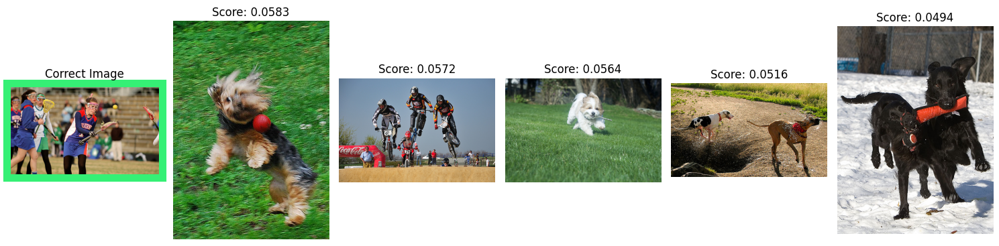

Testing on Image: 1319634306_816f21677f.jpg 


Query: A brown dog is sitting in some long grass .


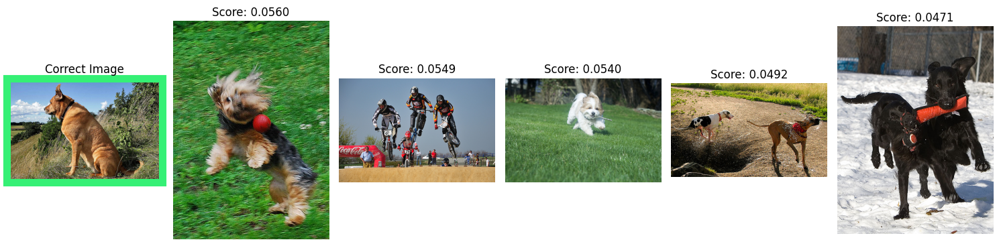

Testing on Image: 1429546659_44cb09cbe2.jpg 


Query: A white dog and a black dog in a field .


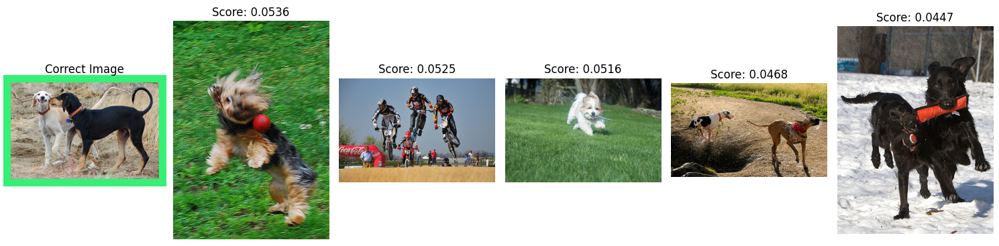

 *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  * 
 Recall@5: 0.0658
 *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  * 


In [40]:
lr_eval = RegressionEvaluator(
    model=model_lr,
    resnet_model=train_dataset.resnet_model,
    bert_model=train_dataset.bert_model,
    dataset=img_dataset,
    device=device,
    tokenizer=train_dataset.tokenizer,
    image_transform=image_transform
)
display_results(lr_eval, top_k=5, break_at=2)


##### Ergebnis (LR)

Obwohl das lineare Regressionsmodell eine RMSE von `0.33` erreicht, bleibt seine Retrieval-Leistung begrenzt, was sich in einem Recall@5 von etwa ca. `0.07` widerspiegelt. Dies zeigt, dass die einfache Vorhersage eines Übereinstimmungswerts aus konkatenierten Embeddings nicht besonders effektiv für die Rangordnung von Bildern entsprechend ihrer zugehörigen Textbeschreibungen ist.

#### Neuronales Netz


##### Training (FC)

In [41]:
class ImageTextFCNN(nn.Module):
    def __init__(
        self, image_dim=2048, text_dim=768, hidden_dim=512, dropout=0.3
    ):
        super().__init__()
        self.fc1 = nn.Linear(image_dim + text_dim, hidden_dim)
        self.relu1 = nn.ReLU()
        self.dropout1 = nn.Dropout(dropout)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim // 2)
        self.relu2 = nn.ReLU()
        self.dropout2 = nn.Dropout(dropout)
        self.fc3 = nn.Linear(hidden_dim // 2, 1)

    def forward(self, image_embeddings, text_embeddings):
        x = torch.cat([image_embeddings, text_embeddings], dim=1)
        x = self.fc1(x)
        x = self.relu1(x)
        x = self.dropout1(x)
        x = self.fc2(x)
        x = self.relu2(x)
        x = self.dropout2(x)
        return self.fc3(x).squeeze(1)


summary(
    ImageTextFCNN().to(device), input_size=[(1, 2048), (1, 768)], device=device
)

Layer (type:depth-idx)                   Output Shape              Param #
ImageTextFCNN                            [1]                       --
├─Linear: 1-1                            [1, 512]                  1,442,304
├─ReLU: 1-2                              [1, 512]                  --
├─Dropout: 1-3                           [1, 512]                  --
├─Linear: 1-4                            [1, 256]                  131,328
├─ReLU: 1-5                              [1, 256]                  --
├─Dropout: 1-6                           [1, 256]                  --
├─Linear: 1-7                            [1, 1]                    257
Total params: 1,573,889
Trainable params: 1,573,889
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 1.57
Input size (MB): 0.01
Forward/backward pass size (MB): 0.01
Params size (MB): 6.30
Estimated Total Size (MB): 6.31

In [42]:
model_fcnn = ImageTextFCNN().to(device)
optimizer_fcnn = torch.optim.Adam(model_fcnn.parameters(), lr=1e-4)
criterion_fcnn = nn.MSELoss()
trainer_fcnn = Trainer(
    model=model_fcnn,
    train_loader=train_loader,
    val_loader=val_loader,
    optimizer=optimizer_fcnn,
    criterion=criterion_fcnn,
    device=device,
    epochs=EPOCHS_NN,
    patience=3
)
model_file_fcnn = (
    f"model_fcnn_v{VERSION}.{EPOCHS_NN}.{MAX_AMOUNT_OF_DESCRIPTIONS}.pth"
)
if INFERENCE_REG:
    model_fcnn.load_state_dict(torch.load(model_file_fcnn, weights_only=True))
else:
    trainer_fcnn.fit()
    torch.save(model_fcnn.state_dict(), model_file_fcnn)



##### Evaluierung (FC)


In [43]:
calculate_rmse(model_fcnn, val_loader, device)

RMSE: 0.3119


Testing on Image: 123997871_6a9ca987b1.jpg 


Query: Several female lacrosse players are going after a ball .


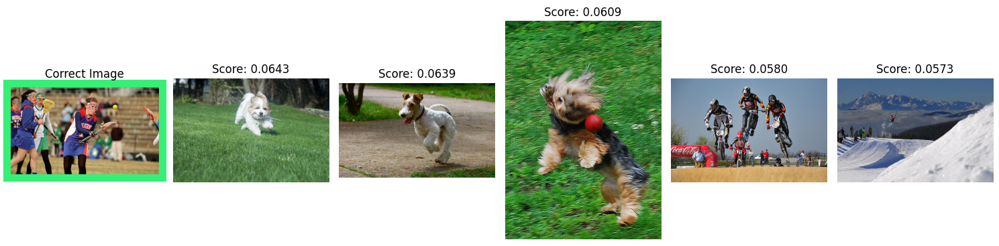

Testing on Image: 1319634306_816f21677f.jpg 


Query: A brown dog is sitting in some long grass .


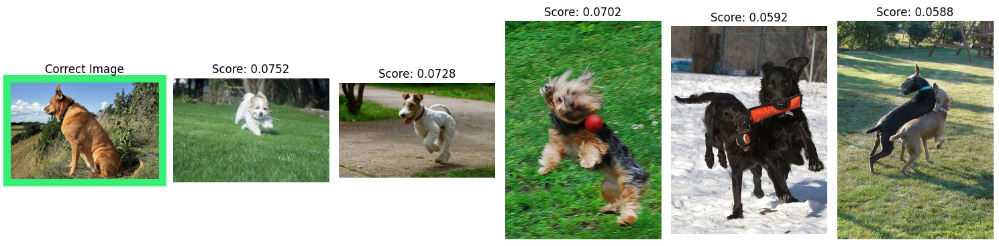

Testing on Image: 1429546659_44cb09cbe2.jpg 


Query: A white dog and a black dog in a field .


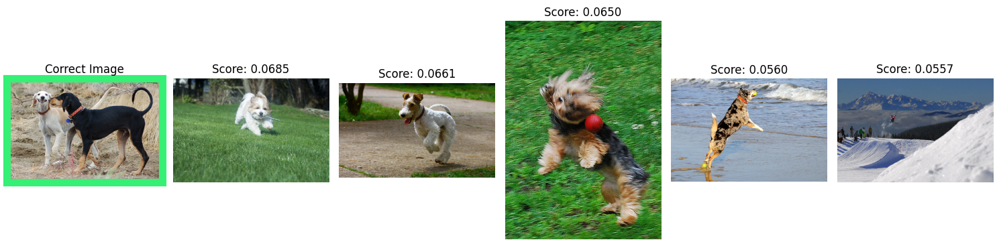

 *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  * 
 Recall@5: 0.1053
 *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  * 


In [44]:
fcnn_eval = RegressionEvaluator(
    model=model_fcnn,
    resnet_model=train_dataset.resnet_model,
    bert_model=train_dataset.bert_model,
    dataset=img_dataset,
    device=device,
    tokenizer=train_dataset.tokenizer,
    image_transform=image_transform
)
display_results(fcnn_eval, top_k=5, break_at=2)


##### Ergebnis (FC)

Das vollständig verbundene neuronale Netzwerk erzielt eine etwas niedrigere RMSE von rund `0.31` und einen Recall@5 von ca. `0.11`. Obwohl dies eine leichte Verbesserung gegenüber dem linearen Modell darstellt, bleibt die Ranking-Performance für ein praktisches Bild-Text-Retrieval überschaubar.

## Dual-Encoder Modell


Im Gegensatz zum Regressionsansatz wird beim Dual-Encoder-Modell ein kontrastiver Loss angewendet: Bilder und Texte werden jeweils separat kodiert, dann in einen gemeinsamen Embedding-Raum projiziert und dort aneinander angeglichen oder auseinandergezogen. Dies verbessert die Eignung für Retrieval-Aufgaben deutlich, da explizit ein gemeinsamer, modalitätsübergreifender Raum gelernt wird.

### Utils (SM)


#### Dataset (SM)

In [45]:
class ImageTextSimilarityDataset(BaseImageTextDataset):
    def __init__(
        self,
        image_dataset_train: dict[str, ImageData],
        max_length: int = 32,
        transform = None
    ):
        super().__init__(
            image_dataset_train, max_length=max_length, transform=transform
        )

    def __getitem__(self, idx):
        _, text, score, image = self.data[idx]
        if self.transform:
            image = self.transform(image)
        encoding = self.tokenizer(
            text,
            padding="max_length",
            truncation=True,
            max_length=self.max_length,
            return_tensors="pt"
        )

        input_ids = encoding["input_ids"].squeeze(0)
        attention_mask = encoding["attention_mask"].squeeze(0)
        return {
            "image": image,
            "input_ids": input_ids,
            "attention_mask": attention_mask,
            "score": torch.tensor(score, dtype=torch.float32)
        }

#### Evaluierung (SM)


In [46]:
class SimilarityEvaluator(BaseEvaluator):
    def encode_text(self, query_texts: list[str]) -> torch.Tensor:
        self.model.eval()
        encoded = self.tokenizer(
            query_texts, padding=True, truncation=True, return_tensors="pt"
        ).to(self.device)

        with torch.no_grad():
            text_embeds = self.model.text_encoder(
                encoded["input_ids"], encoded["attention_mask"]
            )  # shape: (batch, embed_dim)
            text_embeds = text_embeds / text_embeds.norm(dim=1, keepdim=True)

        return text_embeds  # (batch, embed_dim)

    def encode_images(self) -> dict[str, np.ndarray]:
        self.model.eval()
        image_embeds = {}
        for img_name, img_data in self.dataset.test.items():
            image = Image.open(img_data.path).convert("RGB")
            if self.image_transform:
                image = self.image_transform(image)
            image = image.unsqueeze(0).to(self.device)  # (1,3,224,224)
            with torch.no_grad():  # (1, embed_dim)
                img_embedding = self.model.image_encoder(image)
                img_embedding = (
                    img_embedding / img_embedding.norm(dim=1, keepdim=True)
                )
            # (embed_dim,)
            image_embeds[img_name] = img_embedding.cpu().numpy()[0]
        return image_embeds
    
    def compute_scores(
        self,
        text_embeds: torch.Tensor,
        image_embeds: dict[str, np.ndarray]
    ) -> dict[str, np.ndarray]:
        scores = {}
        for img_name, img_embed in image_embeds.items():
            img_embed = torch.tensor(img_embed).squeeze(0)
            similarity = (
                text_embeds @ img_embed.permute(
                    *torch.arange(img_embed.ndim - 1, -1, -1)
                )
            )
            scores[img_name] = similarity.cpu().item()
        return scores


In [47]:
def evaluate_cosine_similarity(
    model: nn.Module, val_loader: DataLoader, device: torch.device
) -> None:
    model.eval()  # Set model to evaluation mode
    cosine_similarities = []
    with torch.no_grad():
        for batch in val_loader:
            images = batch["image"].to(device)
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            image_embeds, text_embeds, _ = model(
                images, input_ids, attention_mask
            )
            image_embeds = (
                image_embeds / image_embeds.norm(dim=1, keepdim=True)
            )  # Norm
            text_embeds = (
                text_embeds / text_embeds.norm(dim=1, keepdim=True)
            )  #    Norm
            batch_cosine_sim = F.cosine_similarity(
                image_embeds, text_embeds, dim=1
            )
            cosine_similarities.append(batch_cosine_sim)
    avg_cosine_similarity = torch.cat(cosine_similarities).mean().item()
    print(f"Cosine Similarity: {avg_cosine_similarity:.4f}")

In [48]:
def eval_similarity_with_mrr_and_recall_at_k(
    model: nn.Module,
    val_loader: DataLoader,
    device: torch.device,
    top_k: list[int]=[1, 5, 10],
) -> dict[str, float]:
    model.eval()  # Set model to evaluation mode
    all_image_embeds, all_text_embeds = [], []
    with torch.no_grad():
        for batch in val_loader:
            images = batch["image"].to(device)
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            image_embeds, text_embeds, _ = model(  # Compute embeddings
                images, input_ids, attention_mask
            )
            all_image_embeds.append(image_embeds)
            all_text_embeds.append(text_embeds)
        # Concatenate all embeddings
    all_image_embeds = torch.cat(all_image_embeds, dim=0)
    all_text_embeds = torch.cat(all_text_embeds, dim=0)
    # Normalize embeddings
    all_image_embeds = (
        all_image_embeds / all_image_embeds.norm(dim=1, keepdim=True)
    )
    all_text_embeds = (
        all_text_embeds / all_text_embeds.norm(dim=1, keepdim=True)
    )
    # Compute similarity matrix
    similarity_matrix = (all_image_embeds @ all_text_embeds.T).cpu().numpy()
    ranks = []  # Compute rank-based metrics
    for i in range(len(similarity_matrix)):
        sorted_indices = np.argsort(-similarity_matrix[i])  # Descending sort
        rank = np.where(sorted_indices == i)[0][0] + 1  # 1-based rank
        ranks.append(rank)
    ranks = np.array(ranks)
    mrr = np.mean(1 / ranks)  # Compute MRR and Recall@K
    recall_at_k = {f"Recall@{k}": np.mean(ranks <= k) for k in top_k}
    return {"Mean Reciprocal Rank (MRR)": mrr, **recall_at_k}


### Training Setup


#### Verlustfunktion


**Normalisierung der Embeddings**  

Bevor die Ähnlichkeitswerte berechnet werden, werden sowohl die Bild- als auch die Text-Embeddings auf Einheitsvektoren normalisiert:  
$$\hat{I}_i = \frac{I_i}{\|I_i\|}$$  
$$\hat{T}_j = \frac{T_j}{\|T_j\|}$$  
wobei:  
- $I_i$ das Bild-Embedding für das Bild $i$ ist,  
- $T_j$ das Text-Embedding für den Text $j$ ist,  
- $\|\cdot\|$ die L2-Norm darstellt.  

Dies stellt sicher, dass alle Embeddings auf der Einheits-Hypersphäre liegen, sodass ihr Skalarprodukt der Kosinus-Ähnlichkeit entspricht.  

---  

**Berechnung der Logits (Ähnlichkeitswerte)**  

Die Ähnlichkeit zwischen jedem Bild-Text-Paar wird mit einem skalierten Skalarprodukt berechnet:  
$$
S_{i,j} = \text{logit scale} \cdot \bigl(\hat{I}_i \cdot \hat{T}_j^T\bigr).
$$  
wobei:  
- $S_{i,j}$ den Logit-Wert (Ähnlichkeit) zwischen Bild $i$ und Text $j$ darstellt,  
- `logit_scale` ein lernbarer Parameter ist, der die Ähnlichkeiten vor der Anwendung von Softmax skaliert.  

Dies ergibt eine Logit-Matrix $S$ der Größe (`batch_size`, `batch_size`), wobei jede Zeile einem Bild und jede Spalte einer Textbeschreibung entspricht.  

In [49]:
def similarity_loss_fn(image_embeds, text_embeds, logit_scale):
    image_embeds = image_embeds / image_embeds.norm(dim=1, keepdim=True)
    text_embeds  = text_embeds  / text_embeds.norm(dim=1, keepdim=True)
    
    logits = logit_scale * (image_embeds @ text_embeds.T)
    labels = torch.arange(len(image_embeds), device=image_embeds.device)
    
    loss_img = F.cross_entropy(logits, labels)
    loss_txt = F.cross_entropy(logits.T, labels)
    return (loss_img + loss_txt) / 2

**Berechnung des Kontrastiven Verlusts (Contrastive Loss)**  

Um sicherzustellen, dass korrekte Paare (diagonale Elemente) die höchste Ähnlichkeit aufweisen, wird die Kreuzentropie-Verlustfunktion angewendet:

- **Bild-zu-Text-Verlust:**  

$$L_{\text{img}} = \frac{1}{N} \sum{i=1}^{N} \text{CrossEntropy}(S_{i,:}, i)$$  

- wobei:  
    - *$S_{i,:}$ die $i$-te Zeile der Ähnlichkeitsmatrix ist (Ähnlichkeiten des Bildes $i$ mit allen Texten).*  
    - *Die Ziel-Labels werden auf den diagonalen Index $i$ gesetzt (passender Text für Bild $i$).*  

- **Text-zu-Bild-Verlust:**  

$$L_{\text{txt}}  = \frac{1}{N} \sum{j=1}^{N} \text{CrossEntropy}(S_{:,j}, j)$$  

- wobei:  
    - *Hier ist $S_{:,j}$ die $j$-te Spalte der Ähnlichkeitsmatrix ist (Ähnlichkeiten des Textes $j$ mit allen Bildern).*  
    - *Die Ziel-Labels werden auf den diagonalen Index $j$ gesetzt (passendes Bild für Text $j$).*  

---

**Finaler Kontrastiver Verlust**  

Der endgültige Verlust wird als Mittelwert beider Verluste berechnet:

$$L = \frac{1}{2} (L_{\text{img}} + L_{\text{txt}})$$  

Dies stellt sicher, dass:  
- Bilder korrekt ihren zugehörigen Texten zugeordnet werden.  
- Texte korrekt ihren entsprechenden Bildern zugeordnet werden.


#### Konfiguration (Training)


In [50]:
class SimilarityTrainer(Trainer):
    def train_step(self, batch) -> float:
        images = batch["image"].to(self.device)
        input_ids = batch["input_ids"].to(self.device)
        attention_mask = batch["attention_mask"].to(self.device)
        self.optimizer.zero_grad()
        image_embeds, text_embeds, logit_scale = self.model(
            images, input_ids, attention_mask
        )
        loss = similarity_loss_fn(image_embeds, text_embeds, logit_scale)
        loss.backward()
        self.optimizer.step()
        return loss.item()

    def val_step(self, batch) -> float:
        with torch.no_grad():
            images = batch["image"].to(self.device)
            input_ids = batch["input_ids"].to(self.device)
            attention_mask = batch["attention_mask"].to(self.device)
            image_embeds, text_embeds, logit_scale = self.model(
                images, input_ids, attention_mask
            )
            loss = similarity_loss_fn(image_embeds, text_embeds, logit_scale)
        return loss.item()

    def evaluate_loss(self, val_loader):
        self.model.eval()
        total_loss = 0.0
        num_batches = 0
        with torch.no_grad():
            for batch in val_loader:
                loss = self.val_step(batch)
                total_loss += loss
                num_batches += 1
        avg_loss = total_loss / num_batches
        return avg_loss


### Encoder

In [51]:
class ImageEncoder(nn.Module):
    def __init__(self, embed_size):
        super().__init__()
        self.resnet = nn.Sequential(
            *list(resnet50(weights=ResNet50_Weights.DEFAULT).children())[:-1]
        )
        self.projection = nn.Linear(2048, embed_size)

    def forward(self, x):
        x = self.resnet(x)
        x = x.view(x.size(0), -1)
        x = self.projection(x)
        return x


class TextEncoder(nn.Module):
    def __init__(self, embed_size):
        super().__init__()
        self.bert = BertModel.from_pretrained("bert-base-uncased")
        self.projection = nn.Linear(768, embed_size)
        
    def forward(self, input_ids, attention_mask):
        outputs = self.bert(input_ids, attention_mask=attention_mask)
        cls_embedding = outputs.last_hidden_state[:, 0, :]
        return self.projection(cls_embedding)


### Modell (SM)

Das **SimilarityModel(embed_size=512)** definiert zwei separate Encoder: **ImageEncoder** auf Basis von **ResNet** und **TextEncoder** auf Basis von **BERT**. Beide enthalten Projektionsebenen (**nn.Linear**), die Bild-Embeddings (ursprünglich 2048-dimensional von ResNet) und Text-Embeddings (ursprünglich 768-dimensional von BERT) in einen gemeinsamen 512-dimensionalen Raum abbilden.

### Mathematische Darstellung der Projektion  

Für ein Bild-Embedding $I \in \mathbb{R}^{2048}$, das aus ResNet extrahiert wurde, wendet die Projektionsebene eine lineare Transformation an:  

$$I{\prime} = W_I I + b_I$$  

wobei:  
- $W_I \in \mathbb{R}^{512 \times 2048}$ die lernbare Gewichtsmatrix für die Projektion ist,  
- $b_I \in \mathbb{R}^{512}$ der Bias-Term ist,  
- $I{\prime} \in \mathbb{R}^{512}$ das projizierte Bild-Embedding ist.  

Ebenso erfolgt für ein Text-Embedding $T \in \mathbb{R}^{768}$, das aus BERT extrahiert wurde, die Projektion nach:  

$$T{\prime} = W_T T + b_T$$  

wobei:  
- $W_T \in \mathbb{R}^{512 \times 768}$ die lernbare Gewichtsmatrix für die Text-Projektion ist,  
- $b_T \in \mathbb{R}^{512}$ der Bias-Term ist,  
- $T{\prime} \in \mathbb{R}^{512}$ das projizierte Text-Embedding ist.  

---

### Bedeutung der Projektion

Diese Projektion ist entscheidend, da sie sicherstellt, dass beide Modalitäten—**Bilder und Texte**—direkt vergleichbar in demselben **512-dimensionalen Merkmalsraum** liegen. Nach der Projektion wird die Ähnlichkeit zwischen einem Bild-Text-Paar durch das Skalarprodukt berechnet:  

$$S(I{\prime}, T{\prime}) = I{\prime} \cdot T{\prime}^T$$  

Oder mithilfe der Kosinus-Ähnlichkeit, bei der die Embeddings normalisiert werden:  

$$\text{sim}(I{\prime}, T{\prime}) = \frac{I{\prime} \cdot T{\prime}^T}{\|I{\prime}\| \|T{\prime}\|}$$  

Diese Ähnlichkeitswerte werden in der Trainingsfunktion verwendet, um **passende Bild-Text-Paare näher zusammenzuführen** und **nicht übereinstimmende Paare weiter auseinander zu schieben**, sodass sich eine optimale Darstellung im gemeinsamen Einbettungsraum ergibt.  

In [52]:
class SimilarityModel(nn.Module):
    def __init__(self, embed_size=512):
        super().__init__()
        self.image_encoder = ImageEncoder(embed_size=embed_size)
        self.text_encoder = TextEncoder(embed_size=embed_size)
        self.logit_scale = nn.Parameter(
            torch.ones([]) * torch.log(torch.tensor(1/0.07))
        )
        
    def forward(self, images, input_ids, attention_mask):
        image_embeds = self.image_encoder(images)
        text_embeds = self.text_encoder(input_ids, attention_mask)
        return image_embeds, text_embeds, self.logit_scale.exp()


summary(
    SimilarityModel().to(device),
    input_data=(
        torch.randn(1, 3, 224, 224).to(device),
        torch.randint(0, 30522, (1, 32)).to(device),
        torch.ones(1, 32).to(device),
    ),
    col_names=["input_size", "output_size", "num_params"],
    depth=2,  # Adjust depth to control the level of nested layers shown
    device=device
)


Layer (type:depth-idx)                                            Input Shape               Output Shape              Param #
SimilarityModel                                                   [1, 3, 224, 224]          [1, 512]                  1
├─ImageEncoder: 1-1                                               [1, 3, 224, 224]          [1, 512]                  --
│    └─Sequential: 2-1                                            [1, 3, 224, 224]          [1, 2048, 1, 1]           23,508,032
│    └─Linear: 2-2                                                [1, 2048]                 [1, 512]                  1,049,088
├─TextEncoder: 1-2                                                [1, 32]                   [1, 512]                  --
│    └─BertModel: 2-3                                             [1, 32]                   [1, 768]                  109,482,240
│    └─Linear: 2-4                                                [1, 768]                  [1, 512]                  393,728

In [53]:
# Remove Augmentation
# ===================
img_dataset.add_agmentation_generator(fx=None)


# Split Data
# ==========
img_dataset_train_sim, img_dataset_val_sim = img_dataset.split_train()
len(img_dataset_train_sim), len(img_dataset_val_sim)


(567, 142)

In [54]:
train_dataset_sim = ImageTextSimilarityDataset(
    img_dataset_train_sim, max_length=32, transform=image_transform
)
val_dataset_sim = ImageTextSimilarityDataset(
    img_dataset_val_sim, max_length=32, transform=image_transform
)
train_loader_sim = DataLoader(
    train_dataset_sim, batch_size=16, shuffle=True, num_workers=0
)
val_loader_sim = DataLoader(
    val_dataset_sim, batch_size=16, shuffle=False, num_workers=0
)


In [55]:
model_sim = SimilarityModel(embed_size=512).to(device)
optimizer_clip = torch.optim.Adam(model_sim.parameters(), lr=1e-4)
trainer_sim = SimilarityTrainer(
    model=model_sim,
    train_loader=train_loader_sim,
    val_loader=val_loader_sim,
    optimizer=optimizer_clip,
    criterion=None,  # !
    device=device,
    epochs=EPOCHS_SM,
    patience=3
)
model_file_sm = f"model_sm_v{VERSION}.{EPOCHS_SM}.pth"
if INFERENCE_SM:
    model_sim.load_state_dict(
        torch.load(model_file_sm, weights_only=True)
    )
else:
    trainer_sim.fit()
    torch.save(model_sim.state_dict(), model_file_sm)


#### Evaluierung

In [56]:
evaluate_cosine_similarity(model_sim, val_loader_sim, device)
trainer_sim.evaluate_loss(val_loader_sim)

Cosine Similarity: 0.2704


1.3531327446301777

In [57]:
sim_metric = eval_similarity_with_mrr_and_recall_at_k(
    model_sim, val_loader_sim, device
)
for metric_key, metric_value in sim_metric.items():
    print(f"{metric_key:>30}: {metric_value:.4f}")


    Mean Reciprocal Rank (MRR): 0.3076
                      Recall@1: 0.1479
                      Recall@5: 0.4789
                     Recall@10: 0.6408


**Mittlerer Reziproker Rang (MRR): Misst, wie gut das Modell den korrekten Text für jedes Bild einordnet.**  

$$MRR = \frac{1}{N} \sum_{i=1}^{N} \frac{1}{\text{rank}_i}$$  

*Höher ist besser (max: 1.0)*  

**Recall@K (R@K): Misst, wie oft die korrekte Übereinstimmung in den Top-K-Ergebnissen erscheint.**  

$$R@K = \frac{\text{korrekte Treffer in den Top-K}}{\text{Gesamtanzahl der Anfragen}}$$  

*Beispiel: Wenn R@5 = 0,85 ist, bedeutet das, dass in 85 % der Fälle der korrekte Text unter den Top-5-Vorhersagen ist.* 


Testing on Image: 123997871_6a9ca987b1.jpg 


Query: Several female lacrosse players are going after a ball .


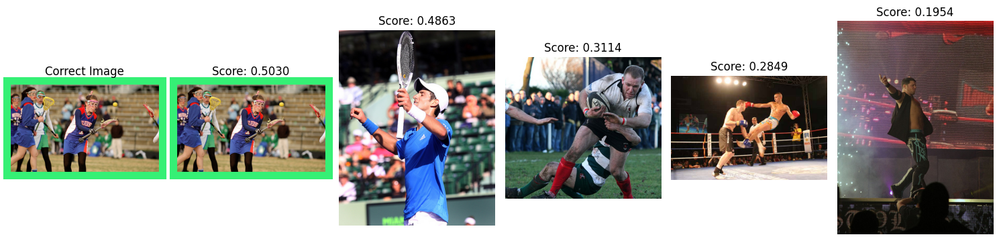

Testing on Image: 1319634306_816f21677f.jpg 


Query: A brown dog is sitting in some long grass .


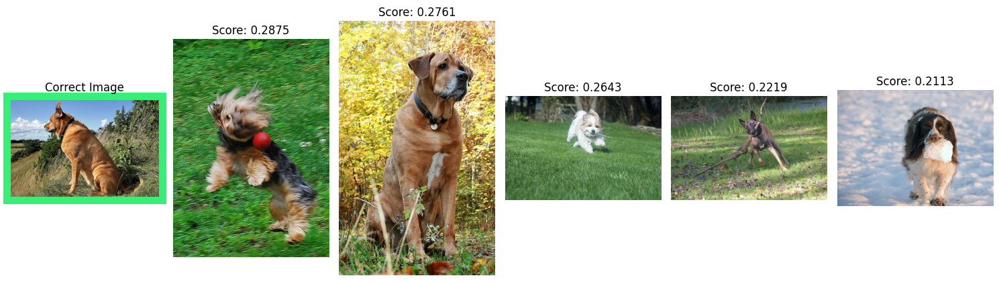

Testing on Image: 1429546659_44cb09cbe2.jpg 


Query: A white dog and a black dog in a field .


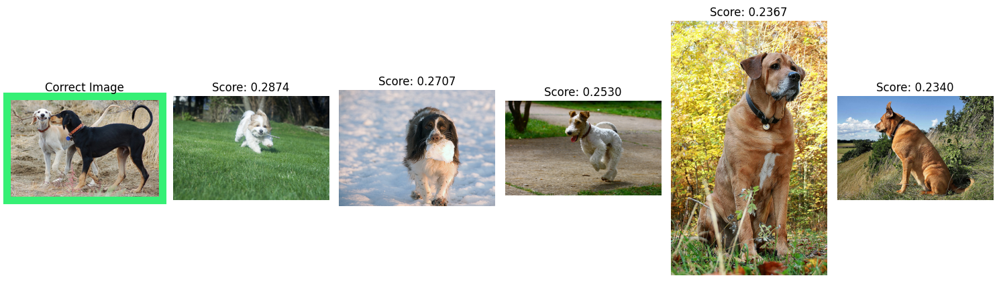

Testing on Image: 1580671272_3e99d94305.jpg 


Query: A man feeding a horse wearing a blue strapped blanket .


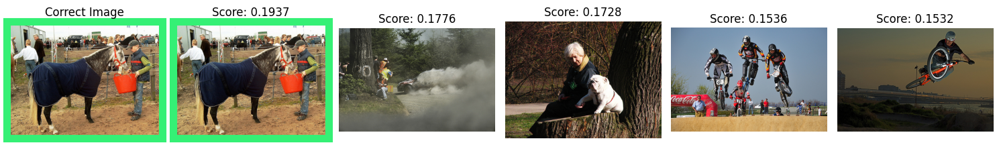

Testing on Image: 1745110280_0cbff5e273.jpg 


Query: A brown dog with a black collar stands next to a bush .


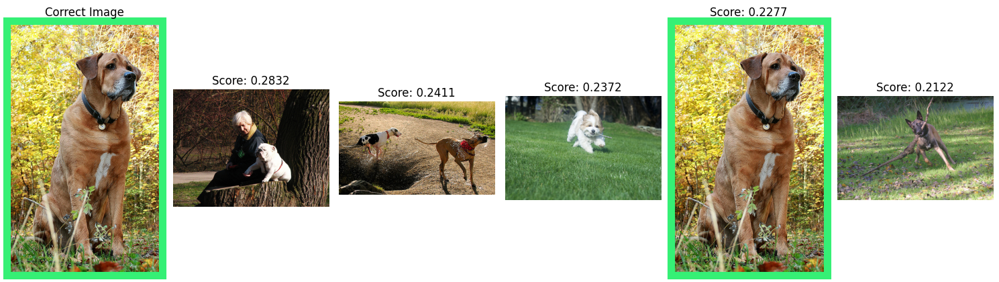

 *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  * 
 Recall@5: 0.6184
 *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  *  * 


In [58]:
sim_eval = SimilarityEvaluator(
    model_sim,
    img_dataset,
    device=device,
    tokenizer=train_dataset.tokenizer,
    image_transform=image_transform
)
display_results(sim_eval, top_k=5, break_at=4)

#### Ergebnis (SM)

Die kontrastive Methode ermöglicht eine robustere Bild-Text-Ausrichtung im Vergleich zu regressionsbasierten Modellen. Ihr MRR von `0.31` und ein Recall@5 von etwa `0.62` zeigen eine deutlich bessere Retrieval-Leistung. Durch die Optimierung der Embeddings mit kontrastivem Verlust ordnet dieses Dual-Encoder-Design relevante Bilder effektiver höher ein und bestätigt sich damit als eine leistungsstärkere Methode für die Text-zu-Bild-Suche.


## Machbarkeitsprototyp

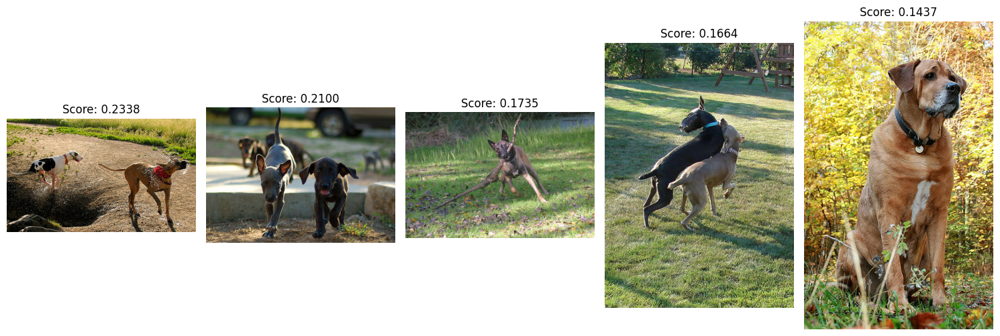

In [59]:
sim_eval.mvp_image_search("Animals")

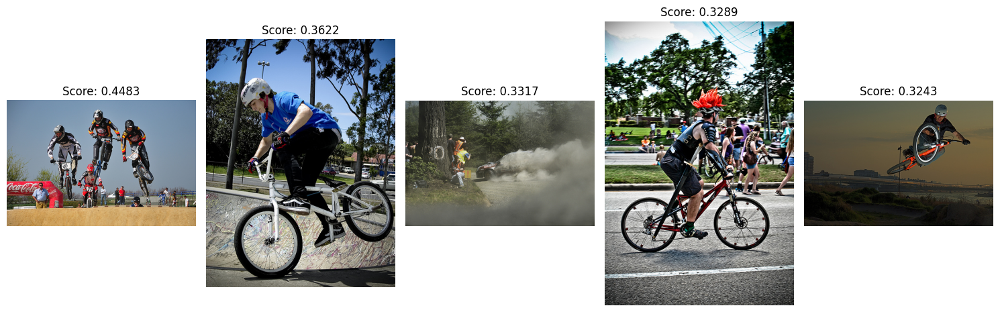

In [60]:
sim_eval.mvp_image_search("Cyclist")

### Fazit (MVP)

Beim Testen des MVP mit Beispielsuchbegriffen wie „Cyclist“ oder „Animals“ ruft das System in vielen Fällen ein korrektes oder zumindest passendes Bild innerhalb der Top-Ergebnisse ab. Dies verdeutlicht die Machbarkeit eines textbasierten Bildretrievals auf Basis eines Dual-Encoder-Modells. Es unterstreicht, dass kontrastives Training – durch explizites Angleichen passender und Separieren unpassender Paare – in der Regel signifikant bessere Ergebnisse als rein regressionsbasierte Verfahren liefert.


## Zusammenfassung


**Kontrastiver Ansatz überzeugt:**

Der Ansatz mit separaten Encodern für Bild und Text, die über einen kontrastiven Loss verknüpft werden, führt zu spürbar besseren Retrieval-Resultaten als einfache Regressionsmodelle. Insbesondere der Recall@5 und MRR (Mean Reciprocal Rank) fallen wesentlich höher aus.

**Regressionsmodelle nur begrenzt geeignet:**

Zwar kann ein lineares oder fully connected Regressionsmodell die Plausibilität eines Bild-Text-Paares lernen, doch für ein effektives Ranking sind diese Ansätze weniger leistungsfähig.

**Rechtliche Anforderungen:**

Bilder, die auf mögliche gesetzliche Verstöße hinweisen, wurden konsequent ausgeschlossen. Dies verringert die Datengrundlage, ist jedoch für die Compliance unverzichtbar.

**Machbarkeit belegt:**

Das Projekt zeigt, dass bereits mit einem vergleichsweise kleinen, gefilterten Datensatz ein Prototyp erstellt werden kann, der relevante Ergebnisse zurückliefert. Für einen produktiven Einsatz empfiehlt sich die Ausweitung des Datensatzes, erweiterte Augmentierung und ggf. das Einfrieren großer Teile des Backbones (Speichergründe) oder effizientere Methoden zur Negativbeispiel-Sammlung.